In [1]:
# Import library modules
import cv2 as cv  # OpenCV library
import matplotlib.pyplot as plt
import numpy as np
import os
import re
import sklearn
import sys
try:
    import layoutparser as lp
except:
    !pip install layoutparser torchvision && pip install "git+https://github.com/facebookresearch/detectron2.git@v0.5#egg=detectron2"
    !pip install "layoutparser[ocr]"
    import layoutparser as lp

In [2]:
# Source: https://www.codeforests.com/2020/11/05/python-suppress-stdout-and-stderr/
# Used to supress output generated by layoutparser
class suppress_output:
    def __init__(self, suppress_stdout=False, suppress_stderr=False):
        self.suppress_stdout = suppress_stdout
        self.suppress_stderr = suppress_stderr
        self._stdout = None
        self._stderr = None

    def __enter__(self):
        devnull = open(os.devnull, "w")
        if self.suppress_stdout:
            self._stdout = sys.stdout
            sys.stdout = devnull

        if self.suppress_stderr:
            self._stderr = sys.stderr
            sys.stderr = devnull

    def __exit__(self, *args):
        if self.suppress_stdout:
            sys.stdout = self._stdout
        if self.suppress_stderr:
            sys.stderr = self._stderr

In [3]:
def displayImg(rgb_img, high_res=False, title=None, save_info=None):
    if not high_res:
        fig = plt.figure()
        fig.set_size_inches(5, 5)
    if title:
        plt.title(title)
    plt.imshow(rgb_img)
    if save_info:
        directory, filename = save_info
        # Source: https://stackoverflow.com/a/13593932
        new_title = re.sub(r'[^\w_.-]', '_', title)
        plt.savefig(directory + new_title + "_" + filename,
                    bbox_inches='tight')
    plt.show()

In [4]:
def getAllEdges(rgb_img,
                kernel_size=8,
                lower_thresh_fact=0.7,
                upper_thresh_fact=1.2):
    # Optimal Canny bounds source: https://stackoverflow.com/a/62856504
    blur_img = cv.blur(rgb_img, ksize=(kernel_size, kernel_size))
    median_pix = np.median(blur_img)
    lower = int(max(0, lower_thresh_fact * median_pix))
    upper = int(min(255, upper_thresh_fact * median_pix))
    img_edges = cv.Canny(image=blur_img, threshold1=lower, threshold2=upper)
    return img_edges

In [5]:
def getEdgeMask(
    rgb_img,
    scale_percent=15,  # percent of original size
    kernel_size=7,
    lower_thresh_fact=0.7,
    upper_thresh_fact=1.2,
    hough_rho=1,  # distance resolution in pixels of the Hough grid
    hough_thresh=6,  # minimum number of votes (intersections in Hough grid cell)
    hough_min_line_length=80,  # minimum number of pixels making up a line
    hough_max_line_gap=50  # maximum gap in pixels between connectable line segments
):
    # Scale logic source: https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/
    width = int(rgb_img.shape[1] * scale_percent / 100)
    height = int(rgb_img.shape[0] * scale_percent / 100)
    dim = (width, height)
    rsz_img = cv.resize(rgb_img, dim, interpolation=cv.INTER_AREA)

    # Optimal Canny bounds source: https://stackoverflow.com/a/62856504
    gray_img = cv.cvtColor(rsz_img, cv.COLOR_RGB2GRAY)
    blur_img = cv.blur(gray_img, ksize=(kernel_size, kernel_size))
    median_pix = np.median(blur_img)
    lower = int(max(0, lower_thresh_fact * median_pix))
    upper = int(min(255, upper_thresh_fact * median_pix))
    edges = cv.Canny(image=blur_img, threshold1=lower, threshold2=upper)

    # Hough Line detector source: https://stackoverflow.com/a/45560545
    theta = np.pi / 180  # angular resolution in radians of the Hough grid
    edge_mask = np.copy(rsz_img) * 0  # creating a blank to draw lines on

    # Run Hough on edge detected image
    # Output "lines" is an array containing endpoints of detected line segments
    # How it works: https://homepages.inf.ed.ac.uk/rbf/HIPR2/hough.htm
    lines = cv.HoughLinesP(edges, hough_rho, theta, hough_thresh, np.array([]),
                           hough_min_line_length, hough_max_line_gap)

    # Draw the lines on the edge mask
    for line in lines:
        for x1, y1, x2, y2 in line:
            edge_mask = cv.line(edge_mask, (x1, y1), (x2, y2),
                                color=(255, 0, 0),
                                thickness=8)

    # Resize the edge mask to the size of the input image
    edge_mask = cv.resize(edge_mask, (rgb_img.shape[1], rgb_img.shape[0]),
                          interpolation=cv.INTER_AREA)

    return edge_mask

In [6]:
def applyMask(img, mask):
    # Convert mask to binary
    mask = mask.astype(np.float32)
    gray_mask = cv.cvtColor(mask, cv.COLOR_RGB2GRAY)
    ret, bin_mask = cv.threshold(gray_mask, 1, 255, cv.THRESH_BINARY)
    bin_mask = bin_mask.astype(np.uint8)

    # Apply mask
    masked_img = cv.bitwise_and(img, img, mask=bin_mask)

    return masked_img

In [7]:
def getAllCorners(img_edges,
                  threshold_fact=0.05,
                  dilate_cnt=15,
                  harris_block_size=2,
                  harris_kernel_size=3,
                  harris_fact=0.04):
    # Harris corner detector source: https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html
    img_edges = np.float32(img_edges)
    corners = cv.cornerHarris(img_edges,
                              blockSize=harris_block_size,
                              ksize=harris_kernel_size,
                              k=harris_fact)

    # Corners are enlarged for viewing purposes
    large_corners = np.copy(corners)
    for i in range(dilate_cnt):
        large_corners = cv.dilate(large_corners, None)

    # Threshold for an optimal value, it may vary depending on the image.
    large_corners_img = np.zeros(img_edges.shape)
    corners_img = np.zeros(img_edges.shape)
    large_corners_img[large_corners > threshold_fact *
                      large_corners.max()] = 255
    corners_img[corners > threshold_fact * corners.max()] = 255

    return corners_img, large_corners_img

In [8]:
def getCornerMask(
        rgb_img,
        scale_percent=10,  # percent of original size
        threshold_fact=0.35,
        dilate_cnt=2,
        harris_block_size=2,
        harris_kernel_size=3,
        harris_fact=0.04):
    # Scale logic source: https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/
    width = int(rgb_img.shape[1] * scale_percent / 100)
    height = int(rgb_img.shape[0] * scale_percent / 100)
    dim = (width, height)
    rsz_img = cv.resize(rgb_img, dim, interpolation=cv.INTER_AREA)

    # Harris corner detector source: https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html
    gray_img = cv.cvtColor(rsz_img, cv.COLOR_BGR2GRAY)
    gray_img = np.float32(gray_img)
    corners = cv.cornerHarris(gray_img,
                              blockSize=harris_block_size,
                              ksize=harris_kernel_size,
                              k=harris_fact)

    # Corners are enlarged to account for error when scaling back up
    for i in range(dilate_cnt):
        corners = cv.dilate(corners, None)

    # Scale the corners back to the input img size
    corners = cv.resize(corners, (rgb_img.shape[1], rgb_img.shape[0]),
                        interpolation=cv.INTER_AREA)
    corners_mask = np.copy(rgb_img) * 0

    # Threshold for an optimal value, it may vary depending on the image.
    corners_mask[corners > threshold_fact * corners.max()] = [255, 0, 0]

    return corners_mask

In [9]:
from sklearn.cluster import AgglomerativeClustering


def refineCorners(rgb_img, img_corners, ward_distance_threshold=100):
    corners_clusters = np.flip(np.transpose(np.nonzero(img_corners)), axis=1)

    # Perform Ward hierarchical clustering with distance threshold
    # More info here: https://scikit-learn.org/stable/modules/clustering.html
    ward = AgglomerativeClustering(
        n_clusters=None,
        compute_full_tree=True,
        distance_threshold=ward_distance_threshold).fit(corners_clusters)

    # Average the identified corner clusters
    refined_corners = np.zeros((ward.n_clusters_, 2))
    samples_per_label = np.zeros((ward.n_clusters_))
    for i in range(len(corners_clusters)):
        label = ward.labels_[i]
        refined_corners[label] += corners_clusters[i]
        samples_per_label[label] += 1
    for i in range(ward.n_clusters_):
        refined_corners[i] /= samples_per_label[i]
    refined_corners = np.rint(refined_corners).astype(int)

    # Draw the refined corners
    refined_corners_img = np.copy(rgb_img)
    for corner in refined_corners:
        refined_corners_img = cv.circle(refined_corners_img,
                                        corner,
                                        radius=20,
                                        color=(255, 0, 0),
                                        thickness=8)

    return refined_corners, refined_corners_img

In [10]:
def drawEdgeSegments(rgb_img, edge_segments):
    edge_segments_img = np.copy(rgb_img)
    for line in edge_segments:
        a, b = line
        x1 = a[0]
        y1 = a[1]
        x2 = b[0]
        y2 = b[1]
        edge_segments_img = cv.line(edge_segments_img, (x1, y1), (x2, y2),
                                    color=(255, 0, 0),
                                    thickness=8)
    return edge_segments_img

In [11]:
def getAllEdgeSegments(corners):
    edge_segments = []
    for i in range(len(corners)):
        for j in range(i + 1, len(corners)):
            edge_segments.append((corners[i], corners[j]))
    return edge_segments

In [12]:
# Line intersections source: https://stackoverflow.com/a/3252222
# Line segment intersection using vectors
# See Computer Graphics by F.S. Hill
def getIntersection(line_a, line_b):

    def perp(a):
        b = np.empty_like(a)
        b[0] = -a[1]
        b[1] = a[0]
        return b

    a1, a2 = line_a
    b1, b2 = line_b
    da = a2 - a1
    db = b2 - b1
    dp = a1 - b1
    dap = perp(da)
    denom = np.dot(dap, db)
    num = np.dot(dap, dp)
    if denom != 0:
        intersection = (num / denom.astype(float)) * db + b1
    else:
        intersection = sys.float_info.max * (db * 0)
    intersection = intersection.astype(int)
    return intersection

In [13]:
def removeIntersectingEdgeSegments(rgb_img, edge_segments):
    # Line segment a given by endpoints a1, a2
    # Line segment b given by endpoints b1, b2
    # Returns True if the lines intersect strictly between their endpoints, else False
    def lineSegmentsIntersect(line_a, line_b, intersections_img):
        intersection = getIntersection(line_a, line_b)

        def intersectionBetweenEndpoints(intersection, segment):
            min_x = min(segment[0][0], segment[1][0])
            max_x = max(segment[0][0], segment[1][0])
            min_y = min(segment[0][1], segment[1][1])
            max_y = max(segment[0][1], segment[1][1])
            return (min_x <= intersection[0] <=
                    max_x) and (min_y <= intersection[1] <= max_y)

        within_bounds = intersectionBetweenEndpoints(
            intersection, line_a) and intersectionBetweenEndpoints(
                intersection, line_b)

        a1, a2 = line_a
        b1, b2 = line_b
        not_segment_endpoint = not (np.allclose(intersection, a1)
                                    or np.allclose(intersection, a2)
                                    or np.allclose(intersection, b1)
                                    or np.allclose(intersection, b2))

        intersect = within_bounds and not_segment_endpoint
        if intersect:
            intersections_img = cv.circle(intersections_img,
                                          intersection,
                                          radius=20,
                                          color=(255, 0, 0),
                                          thickness=8)
        return intersect

    # Find the intersecting line segments
    intersections_img = np.copy(rgb_img)
    intersecting_segments = set()
    for i in range(len(edge_segments)):
        for j in range(i + 1, len(edge_segments)):
            if (lineSegmentsIntersect(edge_segments[i], edge_segments[j],
                                      intersections_img)):
                intersecting_segments.add(i)
                intersecting_segments.add(j)
    intersecting_segments = list(intersecting_segments)

    # Remove the intersecting line segments
    refined_edge_segments = list(np.copy(edge_segments))
    for idx in reversed(intersecting_segments):
        del refined_edge_segments[idx]

    return refined_edge_segments, intersections_img

In [14]:
def getPointsDist(pt_a, pt_b):
    ax = pt_a[0]
    ay = pt_a[1]
    bx = pt_b[0]
    by = pt_b[1]
    dist = np.sqrt((ax - bx)**2 + (ay - by)**2)
    return dist

In [15]:
def removeShortEdgeSegments(edge_segments):
    # Only keep 4 longest edges
    edge_lens = []
    for pt_a, pt_b in edge_segments:
        edge_len = getPointsDist(pt_a, pt_b)
        edge_lens.append((edge_len, (pt_a, pt_b)))

    edge_lens = sorted(edge_lens, reverse=True, key=lambda a: a[0])
    refined_edge_segments = [x for _, x in edge_lens[:4]]

    return refined_edge_segments

In [16]:
def getNewDimensions(rgb_img, edge_segments):
    # Find 'parallel' (non-intersecting) edges
    parallel_edges = []
    for i in range(len(edge_segments)):
        a1, b1 = edge_segments[i]
        for j in range(i + 1, len(edge_segments)):
            a2, b2 = edge_segments[j]
            if not (np.allclose(a1, a2) or np.allclose(b1, b2)
                    or np.allclose(a1, b2) or np.allclose(b1, a2)):
                parallel_edges.append((edge_segments[i], edge_segments[j]))

    # Then find the avg lengths of the parallel line segments
    avg_edge_lengths = []
    for lines in parallel_edges:
        avg_len = 0
        for pt_a, pt_b in lines:
            avg_len += getPointsDist(pt_a, pt_b)
        avg_edge_lengths.append(avg_len / len(lines))

    avg_edge_lengths = np.rint(avg_edge_lengths).astype(int)

    # Get the dimensions for the new image
    new_width = None
    new_height = None
    if rgb_img.shape[1] > rgb_img.shape[0]:
        new_width = max(avg_edge_lengths[0], avg_edge_lengths[1])
        new_height = min(avg_edge_lengths[0], avg_edge_lengths[1])
    else:
        new_width = min(avg_edge_lengths[0], avg_edge_lengths[1])
        new_height = max(avg_edge_lengths[0], avg_edge_lengths[1])

    return new_width, new_height

In [17]:
def getCorrespondingPoints(rgb_img, edge_segments, new_dim):
    new_width, new_height = new_dim

    # Get all corners (which are the endpoints) from the edge segments
    old_corners = set()
    for pt_a, pt_b in edge_segments:
        old_corners.add(tuple(pt_a))
        old_corners.add(tuple(pt_b))
    old_corners = list(old_corners)

    # Construct new corners
    top_left = np.array([0, 0])
    top_right = np.array([new_width - 1, 0])
    bottom_right = np.array([new_width - 1, new_height - 1])
    bottom_left = np.array([0, new_height - 1])
    new_corners = [top_left, top_right, bottom_right, bottom_left]

    # Map old corners to new corners
    old_to_new = dict()
    for pt_a in old_corners:
        best_map = None
        best_map_dist = np.inf
        for pt_b in new_corners:
            dist = getPointsDist(pt_a, pt_b)
            if dist < best_map_dist:
                best_map = pt_b
                best_map_dist = dist
        old_to_new[pt_a] = best_map

    # Create dst_edge_segments that correspnds to the edge_segments
    dst_edge_segments = []
    for pt_a, pt_b in edge_segments:
        dst_edge_segments.append(
            (old_to_new[tuple(pt_a)], old_to_new[tuple(pt_b)]))

    # Construct and display src to dst point pairs
    def addPoints(line,
                  points_list,
                  points_img,
                  point_color,
                  num_points_per_seg=50):
        pt_a, pt_b = line
        a_x = pt_a[0]
        a_y = pt_a[1]
        b_x = pt_b[0]
        b_y = pt_b[1]
        x_vals = np.rint(np.linspace(a_x, b_x,
                                     num=num_points_per_seg)).astype(int)
        y_vals = np.rint(np.linspace(a_y, b_y,
                                     num=num_points_per_seg)).astype(int)
        for x, y in zip(x_vals, y_vals):
            points_list.append([x, y])
            points_img = cv.circle(points_img, (x, y),
                                   color=point_color,
                                   radius=4,
                                   thickness=4)

    src_points = []
    dst_points = []
    points_img = np.copy(rgb_img)
    for src_line, dst_line in zip(edge_segments, dst_edge_segments):
        addPoints(src_line, src_points, points_img, (255, 0, 0))
        addPoints(dst_line, dst_points, points_img, (0, 0, 255))

    return src_points, dst_points, points_img

In [18]:
def performImgUnwarp(rgb_img, src_points, dst_points, new_dim):
    # Compute Homography
    src_points = np.array(src_points)
    dst_points = np.array(dst_points)
    h, _ = cv.findHomography(src_points, dst_points)

    # Apply Homography
    unwarped_img = cv.warpPerspective(rgb_img, h, new_dim)

    return unwarped_img

In [19]:
def unwarpImg(img_path, display_steps=False, high_res=False, save_info=None):
    try:
        # Step 1: Load the image
        bgr_img = cv.imread(img_path)
        rgb_img = cv.cvtColor(bgr_img, cv.COLOR_BGR2RGB)

        # Step 2: Find the potential edges of the document
        all_img_edges = getAllEdges(rgb_img)

        edge_mask = getEdgeMask(rgb_img)
        edge_mask_img = cv.addWeighted(rgb_img, 0.8, edge_mask, 1, 0)

        best_img_edges = applyMask(all_img_edges, edge_mask)

        # Step 3: Find the potential corners of the document
        img_corners, img_large_corners = getAllCorners(best_img_edges)

        corner_mask = getCornerMask(rgb_img)
        corner_mask_img = cv.addWeighted(rgb_img, 0.8, corner_mask, 1, 0)

        best_img_corners = applyMask(img_corners, corner_mask)
        best_img_large_corners = applyMask(img_large_corners, corner_mask)

        # Step 4: Find the best linear approximation of the edges of the document
        refined_corners, refined_corners_img = refineCorners(
            rgb_img, best_img_corners)

        all_edge_segments = getAllEdgeSegments(refined_corners)

        refined_edge_segments, intersections_img = removeIntersectingEdgeSegments(
            rgb_img, all_edge_segments)

        best_edge_segments = removeShortEdgeSegments(refined_edge_segments)

        # Step 5: Un-warp the image
        new_dim = getNewDimensions(rgb_img, best_edge_segments)

        src_points, dst_points, points_img = getCorrespondingPoints(
            rgb_img, best_edge_segments, new_dim)

        unwarped_img = performImgUnwarp(rgb_img, src_points, dst_points,
                                        new_dim)

    finally:
        # Optionaly, we may display all steps
        if display_steps:
            displayImg(all_img_edges, high_res, "All Edges", save_info)
            displayImg(edge_mask_img, high_res, "Prominent Edges Mask", save_info)
            displayImg(best_img_edges, high_res, "Prominent Edges", save_info)
            displayImg(img_large_corners, high_res,
                       "All Corner Clusters (Enlarged for Viewing Purposes)", save_info)
            displayImg(corner_mask_img, high_res,
                       "Prominent Corner Clusters Mask", save_info)
            displayImg(
                best_img_large_corners, high_res,
                "Prominent Corner Clusters (Enlarged for Viewing Purposes)", save_info)
            displayImg(refined_corners_img, high_res,
                       "Prominent Selected Corners", save_info)
            displayImg(drawEdgeSegments(rgb_img, all_edge_segments), high_res,
                       "Segments Connecting All Corners", save_info)
            displayImg(intersections_img, high_res, "Detected Intersections", save_info)
            displayImg(drawEdgeSegments(rgb_img, refined_edge_segments),
                       high_res, "Intersecting Edges Removed", save_info)
            displayImg(drawEdgeSegments(rgb_img, best_edge_segments), high_res,
                       "Four Longest Edges", save_info)
            displayImg(points_img, high_res, "Corresponding Points", save_info)

    return unwarped_img

In [20]:
def getImagesMask(rgb_img):
    bgr_img = cv.cvtColor(rgb_img, cv.COLOR_RGB2BGR)

    # Source: https://layout-parser.readthedocs.io/en/latest/notes/modelzoo.html#example-usage
    with suppress_output(suppress_stdout=True, suppress_stderr=True):
        model = lp.Detectron2LayoutModel(
            "lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config",
            extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
            label_map={
                1: "TextRegion",
                2: "ImageRegion",
                3: "TableRegion",
                4: "MathsRegion",
                5: "SeparatorRegion",
                6: "OtherRegion"
            })

        detected = model.detect(bgr_img)

        detected_regions = lp.draw_box(rgb_img,
                                       detected,
                                       box_width=2,
                                       box_alpha=0.2,
                                       show_element_type=True)

    images_mask = np.zeros(rgb_img.shape).astype(np.uint8)
    for region in detected:
        if region.type == 'ImageRegion':
            start_point = (round(region.block.x_1), round(region.block.y_1))
            end_point = (round(region.block.x_2), round(region.block.y_2))
            images_mask = cv.rectangle(images_mask,
                                       start_point,
                                       end_point,
                                       color=(255, 255, 255),
                                       thickness=-1)
            images_mask = cv.rectangle(images_mask,
                                       start_point,
                                       end_point,
                                       color=(255, 255, 255),
                                       thickness=20)

    return images_mask, detected_regions

In [21]:
def getBlackWhiteImg(rgb_img):
    rgb_img = rgb_img.astype(np.float32)

    gray_img = cv.cvtColor(rgb_img, cv.COLOR_RGB2GRAY).astype(np.uint8)
    _, bin_img = cv.threshold(gray_img, 164, 255, cv.THRESH_BINARY)

    bin_img = bin_img.astype(np.uint8)
    bw_img = np.dstack((bin_img, bin_img, bin_img)).astype(np.uint8)

    return bw_img

In [22]:
def enhanceImg(rgb_img, display_steps=False, high_res=False, save_info=None):
    try:
        # Step 1: Get a mask of all images within the document
        images_mask, detected_regions = getImagesMask(rgb_img)

        # Step 2: Apply mask to extract the plain images
        doc_images = applyMask(rgb_img, images_mask)

        # Step 3: Invert and apply the mask to extract the non-image portions (primarily text)
        non_images_mask = (np.ones(images_mask.shape) * 255 -
                           images_mask).astype(np.uint8)
        doc_non_images = applyMask(rgb_img, non_images_mask)

        # Step 4: Threshold non-images (text) to black and white
        bw_doc_non_images = getBlackWhiteImg(doc_non_images)

        # Step 5: Recombine the images and non-images
        enhanced_img = doc_images + bw_doc_non_images

    finally:
        # Optionaly, we may display all steps
        if display_steps:
            displayImg(rgb_img, high_res, "Unwarped Image", save_info)
            displayImg(detected_regions, high_res, "Detected Regions", save_info)
            displayImg(images_mask, high_res, "Images Mask", save_info)
            displayImg(doc_images, high_res, "Document Images", save_info)
            displayImg(non_images_mask, high_res, "Non-Images Mask", save_info)
            displayImg(doc_non_images, high_res, "Document Non-Images", save_info)
            displayImg(bw_doc_non_images, high_res,
                       "Black & White Document Non-Images", save_info)

    return enhanced_img

In [23]:
def scanImg(img_path, display_steps=False, high_res=False, save_info=None):
    # Part 1: Unwarp the document image
    unwarped_img = unwarpImg(img_path, display_steps, high_res, save_info)

    # Part 2: Enhance the document image
    enhanced_img = enhanceImg(unwarped_img, display_steps, high_res, save_info)

    return enhanced_img

In [24]:
def runTestCases(save_files=False, display_steps=False, high_res=False):
    # Run and display all test cases
    img_folder = 'Images/Raw/'
    img_save_folder = 'Images/Qualitative_Results/'
    img_names = [
        'text_doc.png', 'text_color_im.png', 'text_gray_ims.png',
        'color_ims.png', 'landscape_tables.png', 'bad_corner_detect.png',
        'bad_im_detect.png', 'bad_im_detect2.png'
    ]

    for img_name in img_names:
        img_path = img_folder + img_name
        input_img = cv.cvtColor(cv.imread(img_path), cv.COLOR_BGR2RGB)
        displayImg(input_img, high_res, "Input Image")
        if save_files:
            plt.savefig(img_save_folder + "input_" + img_name,
                        bbox_inches='tight')

        save_info = None
        if save_files:
            save_info = (img_save_folder_other, img_name)
        scan_img = scanImg(img_path, display_steps, high_res, save_info)
        displayImg(scan_img, high_res, "Output Image")
        if save_files:
            plt.savefig(img_save_folder + "output_" + img_name,
                        bbox_inches='tight')
        print()

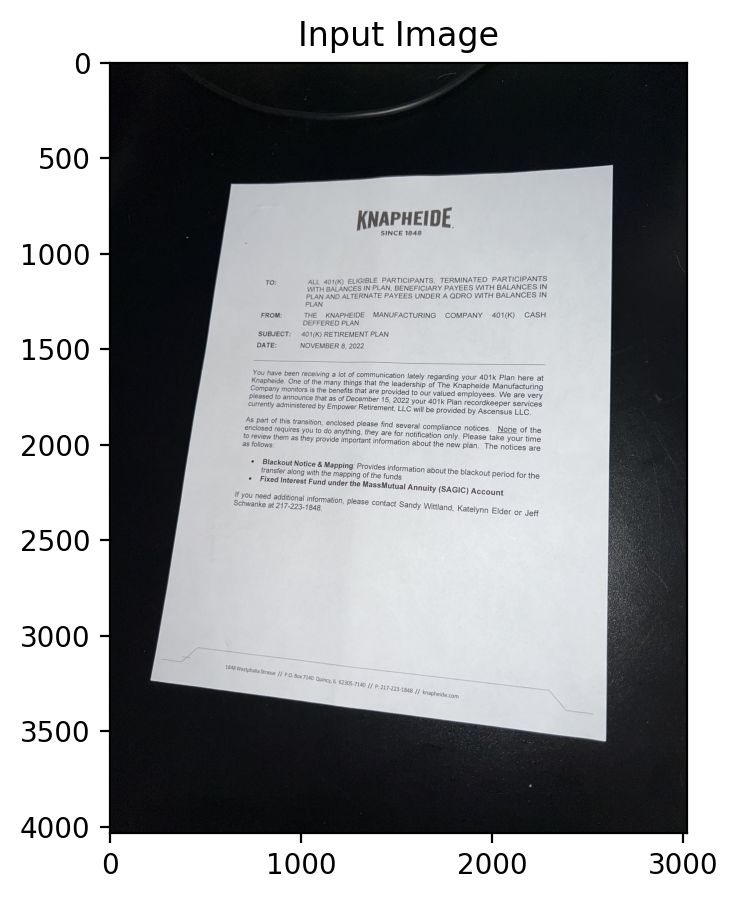

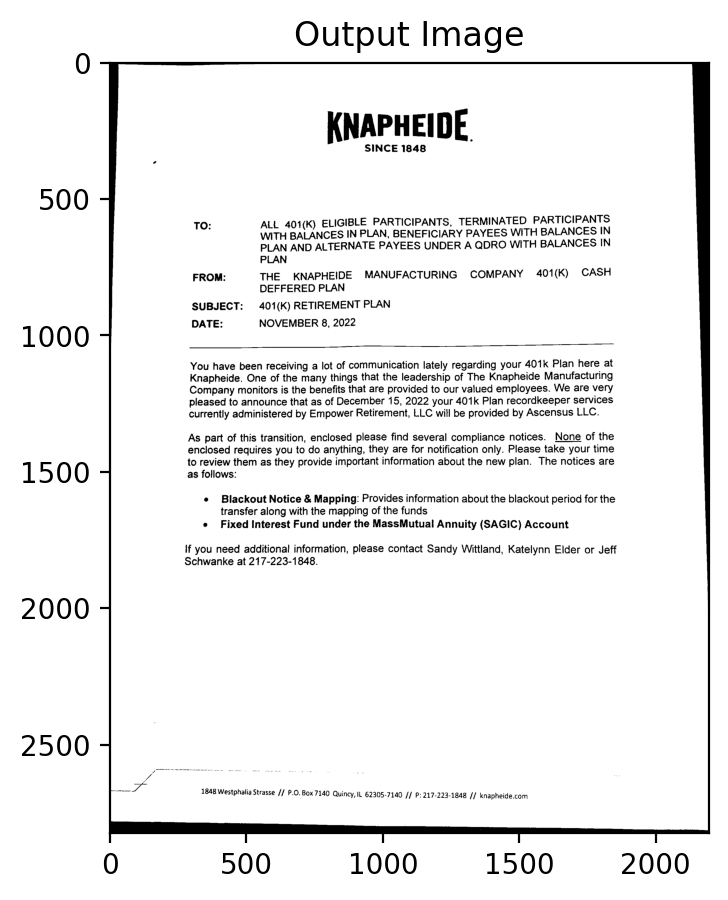

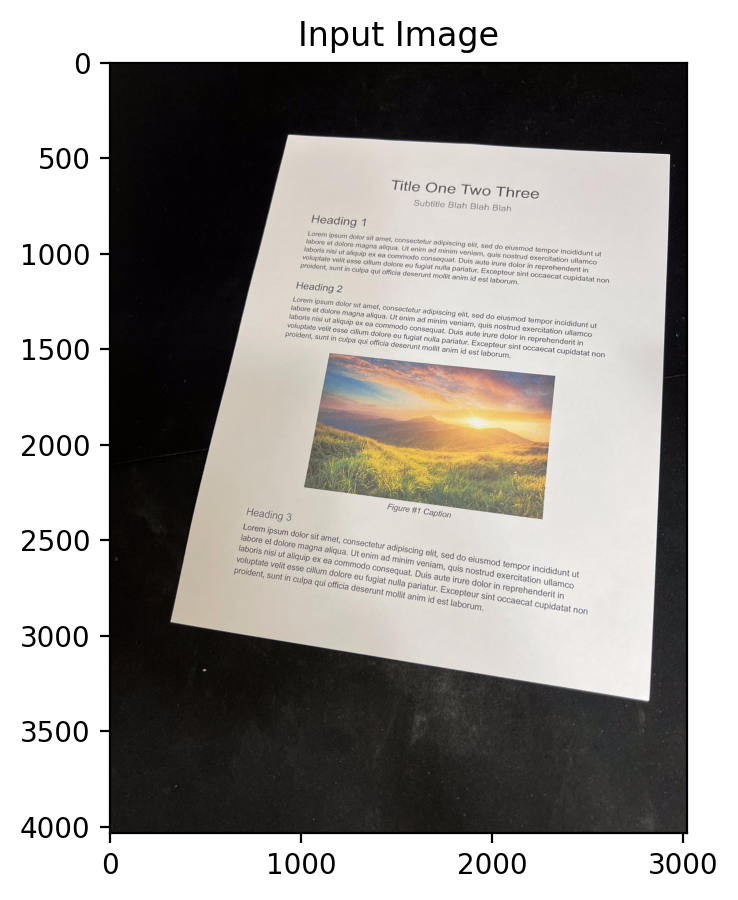

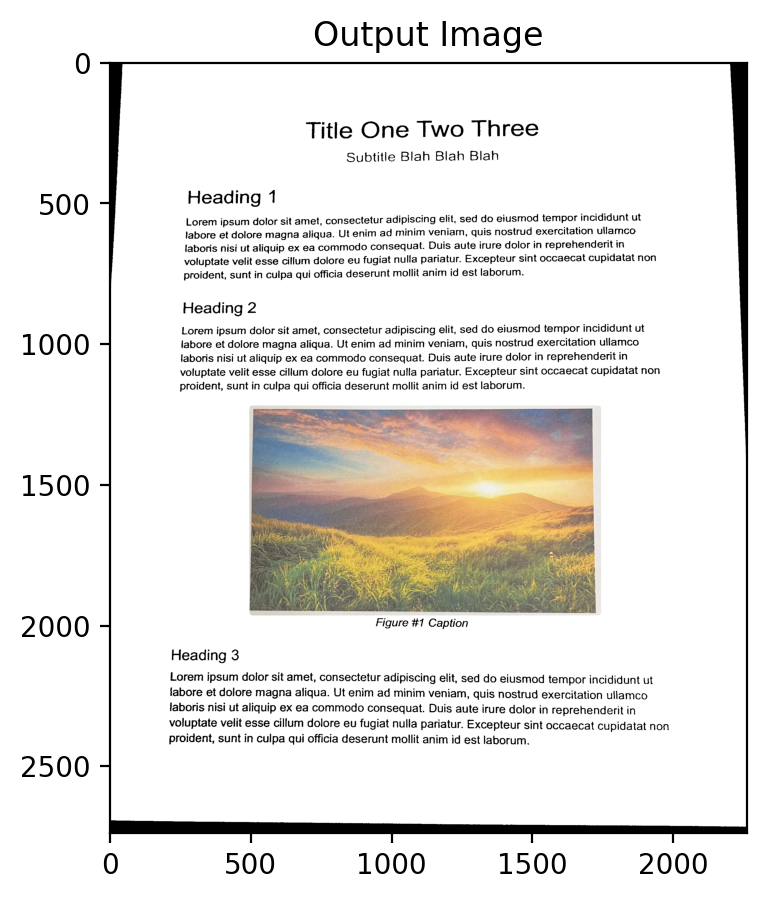

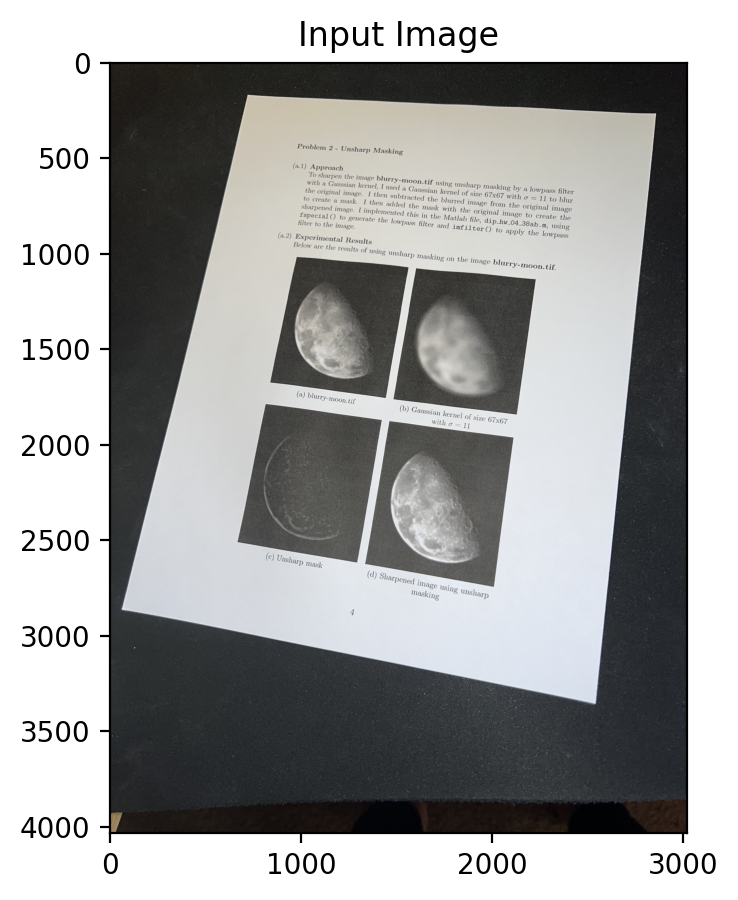

...

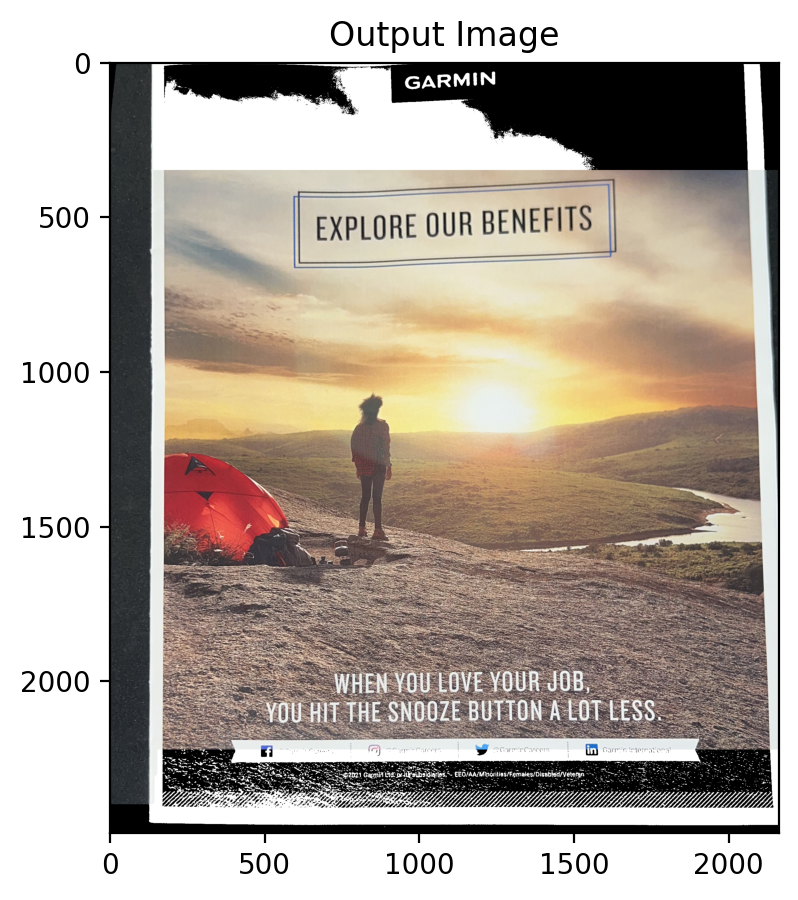

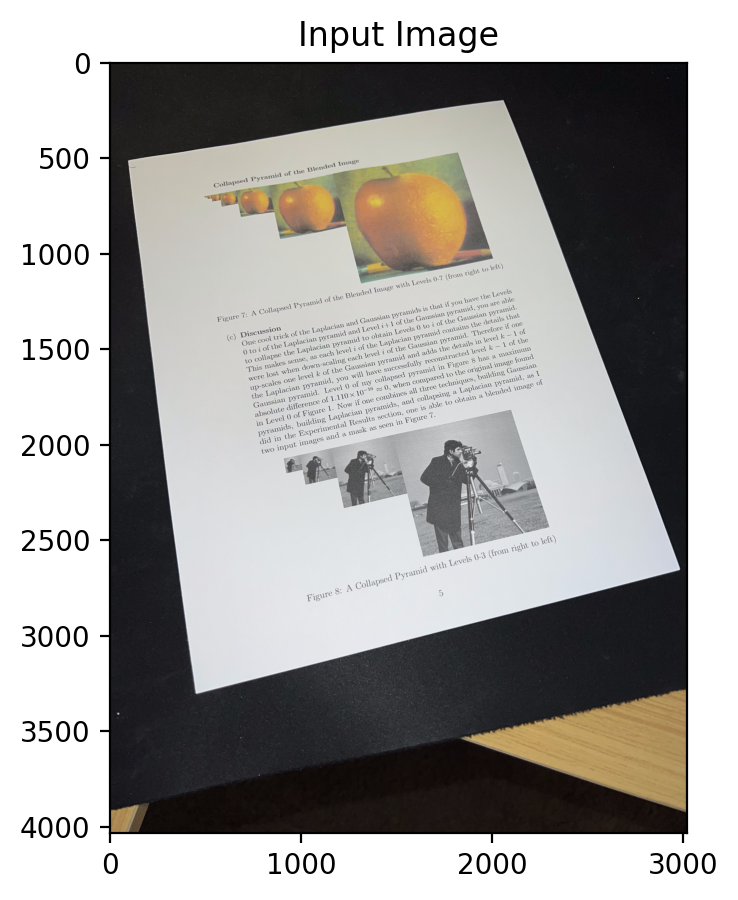

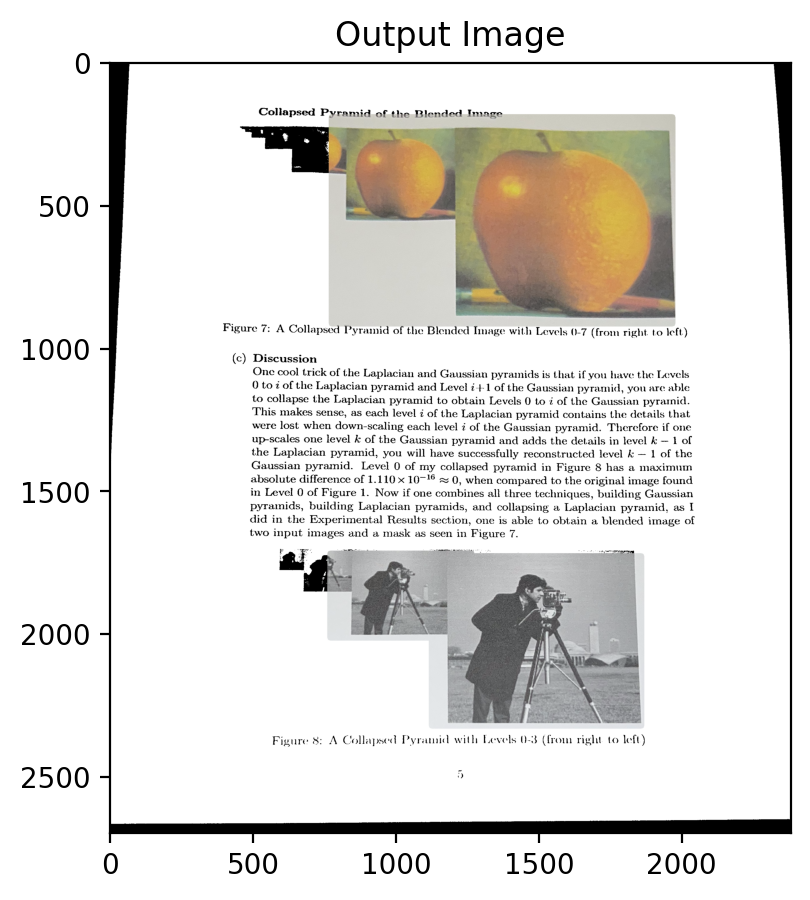

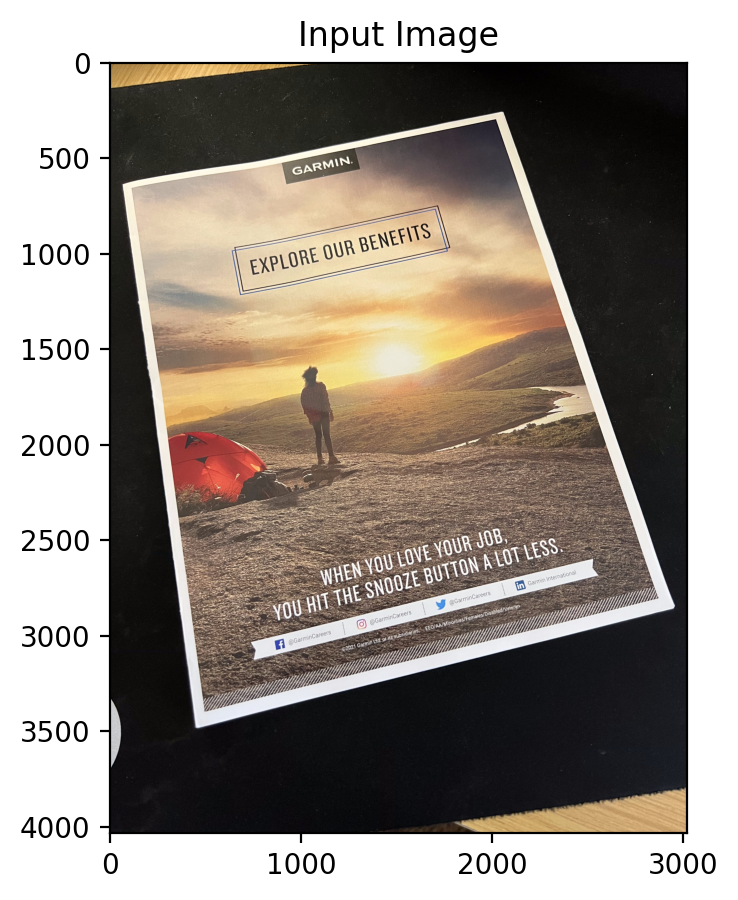

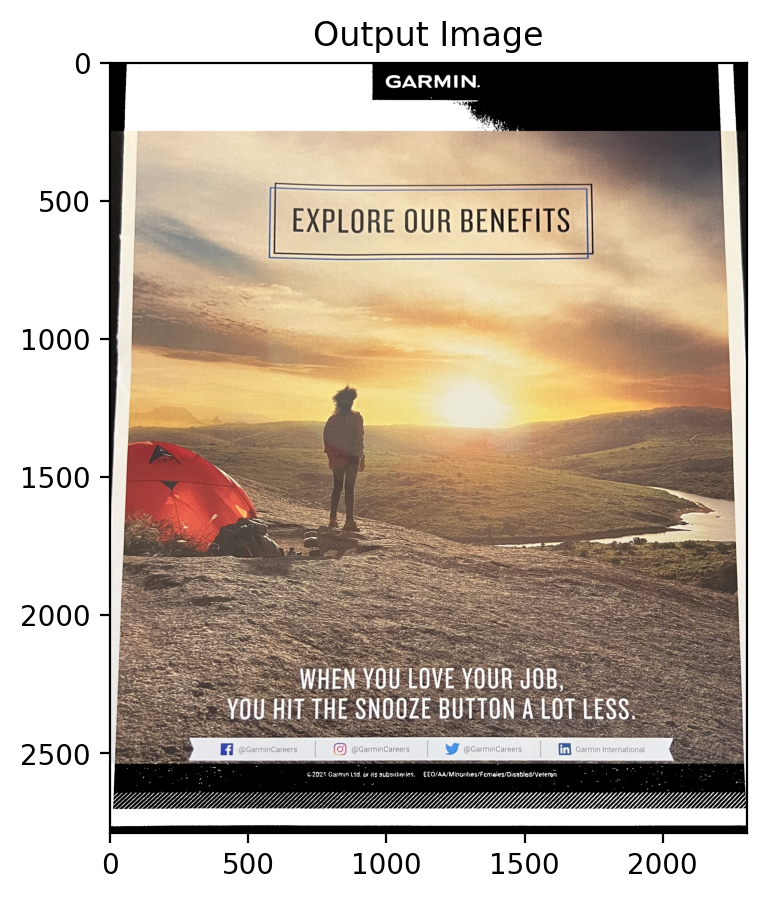

In [25]:
runTestCases(save_files=False, display_steps=False, high_res=False)